# Proyecto Final Data Science - Comision 22890

## Integrantes:

    -) AVILA, Fatima
    -) LAPROVITTERA, Hector
    -) MENGHI, Gonzalo
    -) TORRANO, Florencia


## **Introducción**

Nuestro proyecto busca analizar los datos historicos del Tenis como deporte, buscando generar modelos que nos permitan determinarque caracteristicas hacen ganador a un jugador sobre otro.

#### Preguntas y objetivos de la investigación:
    *) Es posible predecir el resultado de un encuentro? Que caracteristicas priman en un jugador sobre otro?
    *) Cómo afectan las superficies a los resultados?
    *) Puede un modelo de datos ayudar a ‘construir’ una estrategia ganadora o dar a un jugador herramientas para afrontar un encuentro? 
    *) Nuestro objetivo es desarrollar un modelo que resuelva estos interrogantes.


#### Indicación de la fuente del dataset y los criterios de selección (Data Acquisition).

    El repositorio utilizado fue obtenido del siguiente link https://datahub.io/sports-data/atp-world-tour-tennis-data#data

#### Librerías requeridas

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
import pandas_profiling
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

#### Importación de Data Sets

In [2]:
#Como tenemos los datos de los partidos separados en distintos archivos, armamos un unico datafrem usando "pd.concat"
match_scores = pd.concat([
    pd.read_csv('match_scores_1991-2016_unindexed_csv.csv'),
    pd.read_csv('match_scores_2017_unindexed_csv.csv'),
],ignore_index=True) #Nos aseguramos que el indice no se repita


players_overview= pd.read_csv('player_overviews_unindexed_csv.csv')

tournaments = pd.read_csv('tournaments_1877-2017_unindexed_csv.csv')
tournaments = tournaments[tournaments['tourney_year']>=1991]

match_stats = pd.concat([
    pd.read_csv('match_stats_1991-2016_unindexed_csv.csv'),
    pd.read_csv('match_stats_2017_unindexed_csv.csv'),
],ignore_index=True) #Nos aseguramos que el indice no se repita

#### Vamos a inspeccionar cada uno de los archivos

In [3]:
print('Tabla 1: "Match_stats" - Estadísticas de los partidos: ')
print(match_stats.info())

Tabla 1: "Match_stats" - Estadísticas de los partidos: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95767 entries, 0 to 95766
Data columns (total 53 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   tourney_order                     95767 non-null  int64  
 1   match_id                          95767 non-null  object 
 2   match_stats_url_suffix            95767 non-null  object 
 3   match_time                        95617 non-null  object 
 4   match_duration                    95617 non-null  float64
 5   winner_aces                       95617 non-null  float64
 6   winner_double_faults              95617 non-null  float64
 7   winner_first_serves_in            95617 non-null  float64
 8   winner_first_serves_total         95617 non-null  float64
 9   winner_first_serve_points_won     95617 non-null  float64
 10  winner_first_serve_points_total   95617 non-null  float64
 11  winner_seco

In [4]:
print('Tabla 2: "players_overview" - Jugadores: ')
print(players_overview.info())

Tabla 2: "players_overview" - Jugadores: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10912 entries, 0 to 10911
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   player_id      10912 non-null  object 
 1   player_slug    10912 non-null  object 
 2   first_name     10912 non-null  object 
 3   last_name      10912 non-null  object 
 4   player_url     10912 non-null  object 
 5   flag_code      8727 non-null   object 
 6   residence      2014 non-null   object 
 7   birthplace     3038 non-null   object 
 8   birthdate      5114 non-null   object 
 9   birth_year     5114 non-null   float64
 10  birth_month    5114 non-null   float64
 11  birth_day      5114 non-null   float64
 12  turned_pro     1533 non-null   float64
 13  weight_lbs     2706 non-null   float64
 14  weight_kg      2706 non-null   float64
 15  height_ft      2658 non-null   object 
 16  height_inches  2658 non-null   float64
 17  height_c

In [5]:
print('Tabla 3: "tournaments" - Torneos: ')
print(tournaments.info())

Tabla 3: "tournaments" - Torneos: 
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1972 entries, 2142 to 4113
Data columns (total 28 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   tourney_year                  1972 non-null   int64  
 1   tourney_order                 1972 non-null   int64  
 2   tourney_name                  1972 non-null   object 
 3   tourney_id                    1960 non-null   float64
 4   tourney_slug                  1960 non-null   object 
 5   tourney_location              1952 non-null   object 
 6   tourney_dates                 1972 non-null   object 
 7   tourney_month                 1972 non-null   float64
 8   tourney_day                   1972 non-null   float64
 9   tourney_singles_draw          1972 non-null   int64  
 10  tourney_doubles_draw          1972 non-null   int64  
 11  tourney_conditions            1972 non-null   object 
 12  tourney_surface         

In [6]:
print('Tabla 4: "match_scores" - Partidos: ')
print(match_scores.info())

Tabla 4: "match_scores" - Partidos: 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99189 entries, 0 to 99188
Data columns (total 24 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   tourney_year_id         99189 non-null  object
 1   tourney_order           99189 non-null  int64 
 2   tourney_slug            99189 non-null  object
 3   tourney_url_suffix      99189 non-null  object
 4   tourney_round_name      99189 non-null  object
 5   round_order             99189 non-null  int64 
 6   match_order             99189 non-null  int64 
 7   winner_name             99189 non-null  object
 8   winner_player_id        99189 non-null  object
 9   winner_slug             99189 non-null  object
 10  loser_name              99189 non-null  object
 11  loser_player_id         99189 non-null  object
 12  loser_slug              99189 non-null  object
 13  winner_seed             57373 non-null  object
 14  loser_seed       

Observamos que la mayoría de los archivos cuenta con datos numéricos, lo cual nos va a facilitar el análisis.
A su vez, a primera vista contamos con muchos datos que no nos serán de utilidad para responder las preguntas que nos planteamos, y algunos otros son datos rendundantes.
Es por ello que lo que realizaremos a continuación es unir todos estos archivos que tenemos, para lograr quedarnos con 1 solo dataframe en el cual contemos con aquellos datos que suman valor para nuestro análisis.

In [7]:
df0 = pd.merge(match_stats,match_scores,on='match_id')
df0.head()

,tourney_order_x,match_id,match_stats_url_suffix_x,match_time,match_duration,winner_aces,winner_double_faults,winner_first_serves_in,winner_first_serves_total,winner_first_serve_points_won,...,winner_seed,loser_seed,match_score_tiebreaks,winner_sets_won,loser_sets_won,winner_games_won,loser_games_won,winner_tiebreaks_won,loser_tiebreaks_won,match_stats_url_suffix_y
0,0,1991-7308-k181-l206,/en/scores/1991/7308/MS002/match-stats,01:20:00,80.0,3.0,0.0,0.0,65.0,29.0,...,NaN,NaN,75 64,2,0,13,9,0,0,/en/scores/1991/7308/MS002/match-stats
1,0,1991-7308-k181-s351,/en/scores/1991/7308/MS001/match-stats,01:29:00,89.0,1.0,2.0,44.0,65.0,31.0,...,NaN,6,63 16 62,2,1,13,11,0,0,/en/scores/1991/7308/MS001/match-stats
2,0,1991-7308-k181-s424,/en/scores/1991/7308/MS005/match-stats,00:55:00,55.0,0.0,1.0,17.0,36.0,11.0,...,NaN,NaN,63 60,2,0,12,3,0,0,/en/scores/1991/7308/MS005/match-stats
3,0,1991-7308-a031-s331,/en/scores/1991/7308/MS013/match-stats,01:09:00,69.0,2.0,3.0,44.0,58.0,28.0,...,NaN,WC,62 64,2,0,12,6,0,0,/en/scores/1991/7308/MS013/match-stats
4,0,1991-7308-k030-w136,/en/scores/1991/7308/MS009/match-stats,01:29:00,89.0,6.0,3.0,37.0,71.0,25.0,...,NaN,8,75 62,2,0,13,7,0,0,/en/scores/1991/7308/MS009/match-stats


In [8]:
df1 = pd.merge(df0,tournaments,on='tourney_year_id')
print(df1.columns.tolist())

['tourney_order_x', 'match_id', 'match_stats_url_suffix_x', 'match_time', 'match_duration', 'winner_aces', 'winner_double_faults', 'winner_first_serves_in', 'winner_first_serves_total', 'winner_first_serve_points_won', 'winner_first_serve_points_total', 'winner_second_serve_points_won', 'winner_second_serve_points_total', 'winner_break_points_saved', 'winner_break_points_serve_total', 'winner_service_points_won', 'winner_service_points_total', 'winner_first_serve_return_won', 'winner_first_serve_return_total', 'winner_second_serve_return_won', 'winner_second_serve_return_total', 'winner_break_points_converted', 'winner_break_points_return_total', 'winner_service_games_played', 'winner_return_games_played', 'winner_return_points_won', 'winner_return_points_total', 'winner_total_points_won', 'winner_total_points_total', 'loser_aces', 'loser_double_faults', 'loser_first_serves_in', 'loser_first_serves_total', 'loser_first_serve_points_won', 'loser_first_serve_points_total', 'loser_second_

###### Eliminamos columnas que no tienen ingerencia para el análisis

In [9]:
df=df1.drop(['tourney_order_x','tourney_url_suffix_x', 'match_stats_url_suffix_x',
         'winner_seed',
         'loser_seed',
         'match_stats_url_suffix_y',
         'tourney_fin_commit',
         'doubles_winner_1_url',
        'doubles_winner_2_url',
        'singles_winner_url',
            'tourney_month',
            'tourney_day',
            'tourney_url_suffix_y',
            'singles_winner_name', 'singles_winner_player_slug', 'singles_winner_player_id', 
             'doubles_winner_1_name', 'doubles_winner_1_player_slug', 'doubles_winner_1_player_id',
             'doubles_winner_2_name', 'doubles_winner_2_player_slug', 'doubles_winner_2_player_id',
             ], axis=1)
df.head()

,match_id,match_time,match_duration,winner_aces,winner_double_faults,winner_first_serves_in,winner_first_serves_total,winner_first_serve_points_won,winner_first_serve_points_total,winner_second_serve_points_won,...,tourney_order,tourney_name,tourney_id,tourney_slug_y,tourney_location,tourney_dates,tourney_singles_draw,tourney_doubles_draw,tourney_conditions,tourney_surface
0,1991-7308-k181-l206,01:20:00,80.0,3.0,0.0,0.0,65.0,29.0,46.0,12.0,...,1,Adelaide,7308.0,adelaide,Adelaide,1990.12.31,32,32,Outdoor,Hard
1,1991-7308-k181-s351,01:29:00,89.0,1.0,2.0,44.0,65.0,31.0,44.0,12.0,...,1,Adelaide,7308.0,adelaide,Adelaide,1990.12.31,32,32,Outdoor,Hard
2,1991-7308-k181-s424,00:55:00,55.0,0.0,1.0,17.0,36.0,11.0,17.0,13.0,...,1,Adelaide,7308.0,adelaide,Adelaide,1990.12.31,32,32,Outdoor,Hard
3,1991-7308-a031-s331,01:09:00,69.0,2.0,3.0,44.0,58.0,28.0,44.0,7.0,...,1,Adelaide,7308.0,adelaide,Adelaide,1990.12.31,32,32,Outdoor,Hard
4,1991-7308-k030-w136,01:29:00,89.0,6.0,3.0,37.0,71.0,25.0,37.0,19.0,...,1,Adelaide,7308.0,adelaide,Adelaide,1990.12.31,32,32,Outdoor,Hard


A continuación vamos a crear y calcular las columnas que nos van a servir para nuestro análisi:
 * Porcentaje de doble faltas cometidas en el saque sobre el total de servicios.
 * Porcentaje de aces realizados sobre el total de servicios.
 * Porcentaje de puntos ganados en el segundo servicio.

In [10]:
#Porcentaje de doble faltas cometidas en el saque sobre el total de servicios.
df['DFxM_Winner']=df['winner_double_faults']/(df['winner_first_serve_points_total']+df['winner_second_serve_points_total'])
print(df['DFxM_Winner'].head())
print('')

df['DFxM_Loser']=df['loser_double_faults']/(df['loser_first_serve_points_total']+df['loser_second_serve_points_total'])
print(df['DFxM_Loser'].head())
print('')

#Porcentaje de aces realizados sobre el total de servicios.
df['Prom_Aces_Winner']=df['winner_aces']/(df['winner_first_serve_points_total']+df['winner_second_serve_points_total'])
print(df['Prom_Aces_Winner'].head())
print('')

df['Prom_Aces_Loser']=df['loser_aces']/(df['loser_first_serve_points_total']+df['loser_second_serve_points_total'])
print(df['Prom_Aces_Loser'].head())
print('')

#Porcentaje de puntos ganados en el segundo servicio.
df['Pointwin_2server_Winner']=df['winner_second_serve_points_won']/df['winner_second_serve_points_total']
print(df['Pointwin_2server_Winner'].head())
print('')

df['Pointwin_2server_Loser']=df['loser_second_serve_points_won']/df['loser_second_serve_points_total']
print(df['Pointwin_2server_Loser'].head())

0    0.000000
1    0.030769
2    0.027778
3    0.051724
4    0.042254
Name: DFxM_Winner, dtype: float64

0    0.000000
1    0.060241
2    0.037037
3    0.071429
4    0.031250
Name: DFxM_Loser, dtype: float64

0    0.046154
1    0.015385
2    0.000000
3    0.034483
4    0.084507
Name: Prom_Aces_Winner, dtype: float64

0    0.014493
1    0.144578
2    0.037037
3    0.053571
4    0.062500
Name: Prom_Aces_Loser, dtype: float64

0    0.631579
1    0.571429
2    0.684211
3    0.500000
4    0.558824
Name: Pointwin_2server_Winner, dtype: float64

0    0.393939
1    0.416667
2    0.240000
3    0.375000
4    0.428571
Name: Pointwin_2server_Loser, dtype: float64


In [11]:
df.head()

,match_id,match_time,match_duration,winner_aces,winner_double_faults,winner_first_serves_in,winner_first_serves_total,winner_first_serve_points_won,winner_first_serve_points_total,winner_second_serve_points_won,...,tourney_singles_draw,tourney_doubles_draw,tourney_conditions,tourney_surface,DFxM_Winner,DFxM_Loser,Prom_Aces_Winner,Prom_Aces_Loser,Pointwin_2server_Winner,Pointwin_2server_Loser
0,1991-7308-k181-l206,01:20:00,80.0,3.0,0.0,0.0,65.0,29.0,46.0,12.0,...,32,32,Outdoor,Hard,0.000000,0.000000,0.046154,0.014493,0.631579,0.393939
1,1991-7308-k181-s351,01:29:00,89.0,1.0,2.0,44.0,65.0,31.0,44.0,12.0,...,32,32,Outdoor,Hard,0.030769,0.060241,0.015385,0.144578,0.571429,0.416667
2,1991-7308-k181-s424,00:55:00,55.0,0.0,1.0,17.0,36.0,11.0,17.0,13.0,...,32,32,Outdoor,Hard,0.027778,0.037037,0.000000,0.037037,0.684211,0.240000
3,1991-7308-a031-s331,01:09:00,69.0,2.0,3.0,44.0,58.0,28.0,44.0,7.0,...,32,32,Outdoor,Hard,0.051724,0.071429,0.034483,0.053571,0.500000,0.375000
4,1991-7308-k030-w136,01:29:00,89.0,6.0,3.0,37.0,71.0,25.0,37.0,19.0,...,32,32,Outdoor,Hard,0.042254,0.031250,0.084507,0.062500,0.558824,0.428571


#### Como el dataset "df" tiene columnas de análisis del partido para el ganador como para el perdedor por separado, lo que vamos a hacer a continuación es unir todas estas columnas en un solo lugar para poder realizar análisis bivariados más reales

##### Otras modificaciones a realizar en el dataset es eliminar las columnas que no vamos a utilizar para realizar el análisis deseado en nuestro caso, y vamos a terminar uniendo este nuevo dataframe con el df de "players_overview" para traer los datos de los deportistas (nombre completo, año de nacimiento, peso, altura y mano preferida -derecha o izquierda-)

In [12]:
df_ganadores=df.drop(['loser_aces', 'loser_double_faults',
                      'loser_first_serves_in', 'loser_first_serves_total', 'loser_first_serve_points_won',
                      'loser_first_serve_points_total', 'loser_second_serve_points_won', 'loser_second_serve_points_total',
                      'loser_break_points_saved', 'loser_break_points_serve_total', 'loser_service_points_won',
                      'loser_service_points_total', 'loser_first_serve_return_won', 'loser_first_serve_return_total',
                      'loser_second_serve_return_won', 'loser_second_serve_return_total', 'loser_break_points_converted',
                      'loser_break_points_return_total', 'loser_service_games_played', 'loser_return_games_played',
                      'loser_return_points_won', 'loser_return_points_total', 'loser_total_points_won',
                      'loser_total_points_total','tourney_year_id', 'tourney_order_y', 'tourney_slug_x',
                      'tourney_round_name', 'round_order', 'match_order', 'winner_name', 'winner_slug',
                      'loser_name', 'loser_player_id', 'loser_slug', 'match_score_tiebreaks', 'winner_sets_won',
                      'loser_sets_won', 'winner_games_won', 'loser_games_won', 'winner_tiebreaks_won',
                      'loser_tiebreaks_won', 'tourney_year', 'tourney_order','tourney_slug_y', 'tourney_location',
                      'tourney_singles_draw', 'tourney_doubles_draw', 'tourney_conditions',
                      'DFxM_Loser','Prom_Aces_Loser','Pointwin_2server_Loser',
 'winner_first_serves_in',
 'winner_first_serves_total',
 'winner_first_serve_points_won',
 'winner_first_serve_points_total',
 'winner_second_serve_points_won',
 'winner_second_serve_points_total',
 'winner_break_points_saved',
 'winner_break_points_serve_total',
 'winner_service_points_won',
 'winner_service_points_total',
 'winner_first_serve_return_won',
 'winner_first_serve_return_total',
 'winner_second_serve_return_won',
 'winner_second_serve_return_total',
 'winner_break_points_converted',
 'winner_break_points_return_total',
 'winner_service_games_played',
 'winner_return_games_played',
 'winner_return_points_won',
 'winner_return_points_total',
 'winner_total_points_won',
 'winner_total_points_total',], axis=1)
df_ganadores.columns.tolist()

['match_id',
 'match_time',
 'match_duration',
 'winner_aces',
 'winner_double_faults',
 'winner_player_id',
 'tourney_name',
 'tourney_id',
 'tourney_dates',
 'tourney_surface',
 'DFxM_Winner',
 'Prom_Aces_Winner',
 'Pointwin_2server_Winner']

In [13]:
df_ganadores.columns=['match_id',
 'match_time',
 'match_duration',
 'aces','double_faults',
 'player_id',
 'tourney_name',
 'tourney_id','tourney_dates',
 'tourney_surface',
 'Double_Faults_TotServe',
 'Prom_Aces_TotServe',
 'Pointwin_2server']

In [14]:
df_perdedores=df.drop(['winner_aces', 'winner_double_faults', 'winner_first_serves_in', 
                       'winner_first_serves_total', 'winner_first_serve_points_won', 
                       'winner_first_serve_points_total', 'winner_second_serve_points_won', 
                       'winner_second_serve_points_total', 'winner_break_points_saved', 
                       'winner_break_points_serve_total', 'winner_service_points_won', 
                       'winner_service_points_total', 'winner_first_serve_return_won',
                       'winner_first_serve_return_total', 'winner_second_serve_return_won',
                       'winner_second_serve_return_total', 'winner_break_points_converted', 
                       'winner_break_points_return_total', 'winner_service_games_played',
                       'winner_return_games_played', 'winner_return_points_won', 'winner_return_points_total',
                       'winner_total_points_won', 'winner_total_points_total',
                       'loser_first_serves_in', 'loser_first_serves_total', 'loser_first_serve_points_won',
                       'loser_first_serve_points_total', 'loser_second_serve_points_won', 'loser_second_serve_points_total',
                       'loser_break_points_saved', 'loser_break_points_serve_total', 'loser_service_points_won',
                       'loser_service_points_total', 'loser_first_serve_return_won',
                       'loser_first_serve_return_total', 'loser_second_serve_return_won', 'loser_second_serve_return_total',
                       'loser_break_points_converted', 'loser_break_points_return_total', 'loser_service_games_played',
                       'loser_return_games_played', 'loser_return_points_won', 'loser_return_points_total',
                       'loser_total_points_won', 'loser_total_points_total', 'tourney_year_id', 'tourney_order_y',
                       'tourney_slug_x', 'tourney_round_name', 'round_order', 'match_order', 'winner_name',
                       'winner_player_id', 'winner_slug','loser_name', 'loser_slug', 'match_score_tiebreaks', 
                       'winner_sets_won', 'loser_sets_won', 'winner_games_won', 'loser_games_won',
                       'winner_tiebreaks_won', 'loser_tiebreaks_won', 'tourney_order','tourney_slug_y',
                       'tourney_location', 'tourney_year', 'tourney_singles_draw', 'tourney_doubles_draw', 
                       'tourney_conditions','DFxM_Winner','Prom_Aces_Winner', 'Pointwin_2server_Winner' ], axis=1)
df_perdedores.columns.tolist()

['match_id',
 'match_time',
 'match_duration',
 'loser_aces',
 'loser_double_faults',
 'loser_player_id',
 'tourney_name',
 'tourney_id',
 'tourney_dates',
 'tourney_surface',
 'DFxM_Loser',
 'Prom_Aces_Loser',
 'Pointwin_2server_Loser']

In [15]:
df_perdedores.columns=['match_id',
 'match_time',
 'match_duration',
 'aces','double_faults',
 'player_id',
 'tourney_name',
 'tourney_id', 'tourney_dates',
 'tourney_surface',
 'Double_Faults_TotServe',
 'Prom_Aces_TotServe',
 'Pointwin_2server']

In [16]:
df_ganadores=df_ganadores.assign(Result='Winner')
df_perdedores=df_perdedores.assign(Result='Loser')

In [17]:
print(df_ganadores.head())
print('')
print('============================= ')
print('')
print(df_perdedores.head())

              match_id match_time  match_duration  aces  double_faults  \
0  1991-7308-k181-l206   01:20:00            80.0   3.0            0.0   
1  1991-7308-k181-s351   01:29:00            89.0   1.0            2.0   
2  1991-7308-k181-s424   00:55:00            55.0   0.0            1.0   
3  1991-7308-a031-s331   01:09:00            69.0   2.0            3.0   
4  1991-7308-k030-w136   01:29:00            89.0   6.0            3.0   

  player_id tourney_name  tourney_id tourney_dates tourney_surface  \
0      k181     Adelaide      7308.0    1990.12.31            Hard   
1      k181     Adelaide      7308.0    1990.12.31            Hard   
2      k181     Adelaide      7308.0    1990.12.31            Hard   
3      a031     Adelaide      7308.0    1990.12.31            Hard   
4      k030     Adelaide      7308.0    1990.12.31            Hard   

   Double_Faults_TotServe  Prom_Aces_TotServe  Pointwin_2server  Result  
0                0.000000            0.046154          0.631

In [18]:
# Unimos ambos dataframes
frames=[df_ganadores,df_perdedores]
result=pd.concat(frames)
result.columns.tolist()

['match_id',
 'match_time',
 'match_duration',
 'aces',
 'double_faults',
 'player_id',
 'tourney_name',
 'tourney_id',
 'tourney_dates',
 'tourney_surface',
 'Double_Faults_TotServe',
 'Prom_Aces_TotServe',
 'Pointwin_2server',
 'Result']

In [19]:
''' Al df creado, lo unimos con el último archivo que nos quedó pendiente que es el que contiene los datos y características
de cada jugador. '''
result1 = pd.merge(left=result,right=players_overview, on='player_id')
result1

,match_id,match_time,match_duration,aces,double_faults,player_id,tourney_name,tourney_id,tourney_dates,tourney_surface,...,birth_month,birth_day,turned_pro,weight_lbs,weight_kg,height_ft,height_inches,height_cm,handedness,backhand
0,1991-7308-k181-l206,01:20:00,80.0,3.0,0.0,k181,Adelaide,7308.0,1990.12.31,Hard,...,4.0,22.0,1989.0,195.0,88.0,"6'3""",75.0,191.0,NaN,NaN
1,1991-7308-k181-s351,01:29:00,89.0,1.0,2.0,k181,Adelaide,7308.0,1990.12.31,Hard,...,4.0,22.0,1989.0,195.0,88.0,"6'3""",75.0,191.0,NaN,NaN
2,1991-7308-k181-s424,00:55:00,55.0,0.0,1.0,k181,Adelaide,7308.0,1990.12.31,Hard,...,4.0,22.0,1989.0,195.0,88.0,"6'3""",75.0,191.0,NaN,NaN
3,1991-7308-k181-g182,01:35:00,95.0,3.0,2.0,k181,Adelaide,7308.0,1990.12.31,Hard,...,4.0,22.0,1989.0,195.0,88.0,"6'3""",75.0,191.0,NaN,NaN
4,1991-7308-k181-r193,01:03:00,63.0,3.0,0.0,k181,Adelaide,7308.0,1990.12.31,Hard,...,4.0,22.0,1989.0,195.0,88.0,"6'3""",75.0,191.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191410,2016-7485-ca99-sn77,01:04:00,64.0,1.0,3.0,sn77,Antwerp,7485.0,2016.10.17,Hard,...,5.0,20.0,2012.0,176.0,80.0,"6'0""",72.0,183.0,Right-Handed,Two-Handed Backhand
191411,2017-520-kb09-sn77,00:56:00,56.0,1.0,0.0,sn77,Roland Garros,520.0,2017.05.28,Clay,...,5.0,20.0,2012.0,176.0,80.0,"6'0""",72.0,183.0,Right-Handed,Two-Handed Backhand
191412,2017-540-g892-sn77,01:55:00,115.0,6.0,5.0,sn77,Wimbledon,540.0,2017.07.03,Grass,...,5.0,20.0,2012.0,176.0,80.0,"6'0""",72.0,183.0,Right-Handed,Two-Handed Backhand
191413,2017-560-d875-sn77,01:49:00,109.0,4.0,6.0,sn77,US Open,560.0,2017.08.28,Hard,...,5.0,20.0,2012.0,176.0,80.0,"6'0""",72.0,183.0,Right-Handed,Two-Handed Backhand


In [20]:
result1.columns.tolist()

['match_id',
 'match_time',
 'match_duration',
 'aces',
 'double_faults',
 'player_id',
 'tourney_name',
 'tourney_id',
 'tourney_dates',
 'tourney_surface',
 'Double_Faults_TotServe',
 'Prom_Aces_TotServe',
 'Pointwin_2server',
 'Result',
 'player_slug',
 'first_name',
 'last_name',
 'player_url',
 'flag_code',
 'residence',
 'birthplace',
 'birthdate',
 'birth_year',
 'birth_month',
 'birth_day',
 'turned_pro',
 'weight_lbs',
 'weight_kg',
 'height_ft',
 'height_inches',
 'height_cm',
 'handedness',
 'backhand']

In [21]:
''' Nos quedamos unicamente con las columnas que nos van a servir para realizar el proyecto.'''
result2= result1.drop(['player_slug','first_name','last_name','player_url','flag_code','residence','birthplace','birthdate','birth_month',
 'birth_day', 'turned_pro',
 'weight_lbs','height_ft',
 'height_inches'], axis=1)
result2.head()

,match_id,match_time,match_duration,aces,double_faults,player_id,tourney_name,tourney_id,tourney_dates,tourney_surface,Double_Faults_TotServe,Prom_Aces_TotServe,Pointwin_2server,Result,birth_year,weight_kg,height_cm,handedness,backhand
0,1991-7308-k181-l206,01:20:00,80.0,3.0,0.0,k181,Adelaide,7308.0,1990.12.31,Hard,0.000000,0.046154,0.631579,Winner,1971.0,88.0,191.0,NaN,NaN
1,1991-7308-k181-s351,01:29:00,89.0,1.0,2.0,k181,Adelaide,7308.0,1990.12.31,Hard,0.030769,0.015385,0.571429,Winner,1971.0,88.0,191.0,NaN,NaN
2,1991-7308-k181-s424,00:55:00,55.0,0.0,1.0,k181,Adelaide,7308.0,1990.12.31,Hard,0.027778,0.000000,0.684211,Winner,1971.0,88.0,191.0,NaN,NaN
3,1991-7308-k181-g182,01:35:00,95.0,3.0,2.0,k181,Adelaide,7308.0,1990.12.31,Hard,0.027397,0.041096,0.605263,Winner,1971.0,88.0,191.0,NaN,NaN
4,1991-7308-k181-r193,01:03:00,63.0,3.0,0.0,k181,Adelaide,7308.0,1990.12.31,Hard,0.000000,0.065217,0.666667,Winner,1971.0,88.0,191.0,NaN,NaN


In [22]:
result2['tourney_dates'] = pd.to_datetime(result2['tourney_dates'], format="%Y.%m.%d")
result2= result2.sort_values(by='tourney_dates') 
result2['Year'] = result2['tourney_dates'].dt.year
result2['Year']

0         1990
5341      1990
5340      1990
5339      1990
5296      1990
          ... 
154450    2017
154449    2017
184986    2017
184170    2017
154656    2017
Name: Year, Length: 191415, dtype: int64

In [23]:
result2.index = result2['Year']
result2 = result2.drop('Year', axis='columns')
result2.head()

,match_id,match_time,match_duration,aces,double_faults,player_id,tourney_name,tourney_id,tourney_dates,tourney_surface,Double_Faults_TotServe,Prom_Aces_TotServe,Pointwin_2server,Result,birth_year,weight_kg,height_cm,handedness,backhand
Year,,,,,,,,,,,,,,,,,,,
1990,1991-7308-k181-l206,01:20:00,80.0,3.0,0.0,k181,Adelaide,7308.0,1990-12-31,Hard,0.000000,0.046154,0.631579,Winner,1971.0,88.0,191.0,NaN,NaN
1990,1991-354-c009-g212,00:55:00,55.0,2.0,1.0,c009,Wellington,354.0,1990-12-31,Hard,0.027778,0.055556,0.666667,Winner,1968.0,78.0,188.0,NaN,NaN
1990,1991-354-c009-z045,01:14:00,74.0,2.0,0.0,c009,Wellington,354.0,1990-12-31,Hard,0.000000,0.040000,0.653846,Winner,1968.0,78.0,188.0,NaN,NaN
1990,1991-354-c009-h029,01:42:00,102.0,7.0,2.0,c009,Wellington,354.0,1990-12-31,Hard,0.025000,0.087500,0.526316,Winner,1968.0,78.0,188.0,NaN,NaN
1990,1991-354-b040-p198,01:27:00,87.0,2.0,1.0,p198,Wellington,354.0,1990-12-31,Hard,0.014286,0.028571,0.580645,Loser,1968.0,75.0,183.0,NaN,NaN


##### Vamos a proceder a analizar los Nulls 

<AxesSubplot:>

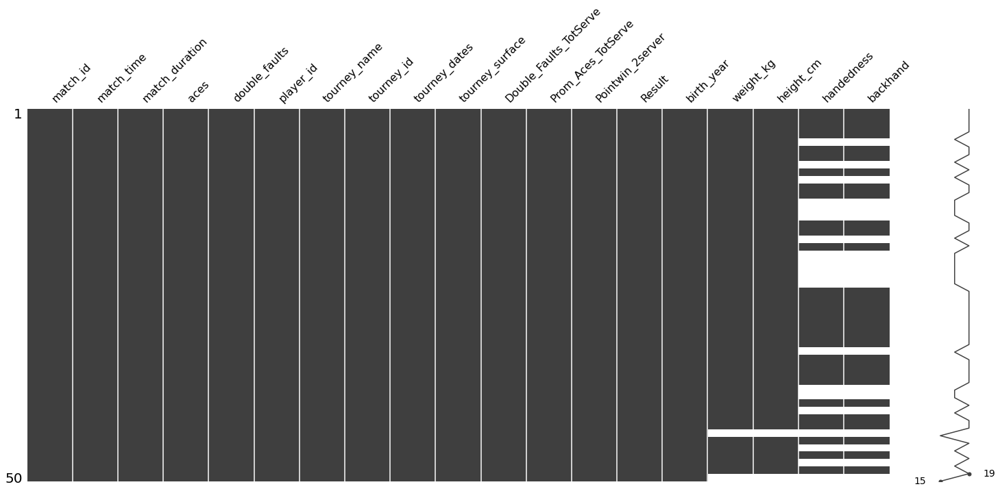

In [24]:
import missingno as msno
%matplotlib inline
msno.matrix(result2.sample(50))

Vemos que la mayor cantidad de faltantes provienen de la columna de mano hábil del jugador y estilo de revés utilizado.
Al ser mucha la cantidad de datos faltantes, y al no tener la posibilidad de predecir o aproximar dichos faltantes, lo que haremos es una limpieza del data frame eliminando aquellas filas que contengan datos null.

In [25]:
result3= result2.dropna()
result3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 122986 entries, 1990 to 2017
Data columns (total 19 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   match_id                122986 non-null  object        
 1   match_time              122986 non-null  object        
 2   match_duration          122986 non-null  float64       
 3   aces                    122986 non-null  float64       
 4   double_faults           122986 non-null  float64       
 5   player_id               122986 non-null  object        
 6   tourney_name            122986 non-null  object        
 7   tourney_id              122986 non-null  float64       
 8   tourney_dates           122986 non-null  datetime64[ns]
 9   tourney_surface         122986 non-null  object        
 10  Double_Faults_TotServe  122986 non-null  float64       
 11  Prom_Aces_TotServe      122986 non-null  float64       
 12  Pointwin_2server        12298

A partir del uso del pandas_profiling vamos a buscar tener vista muy rápida y resumida de un conjunto de datos

In [26]:
profile = pandas_profiling.ProfileReport(result3)
pandas_profiling = profile.to_file("reporttenis.html")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### Análisis exploratorio de los datos 

Text(0.5, 0, 'Jugador')

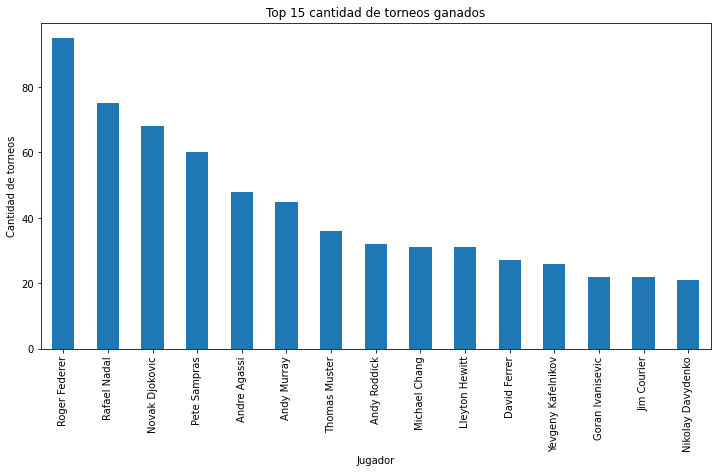

In [27]:
# Grafico de barra de torneos ganados por jugador
fig, ax = plt.subplots(figsize=(12,6))
tournaments['singles_winner_name'].sort_values().value_counts().head(15).plot.bar()
ax.set_title('Top 15 cantidad de torneos ganados')
ax.set_ylabel('Cantidad de torneos')
ax.set_xlabel('Jugador')

En el gráfico anterior podemos ver el top 15 de jugadores que más torneos han ganado desde 1990 a 2016. Se observa que el más ganador ha sido Roger Federer.

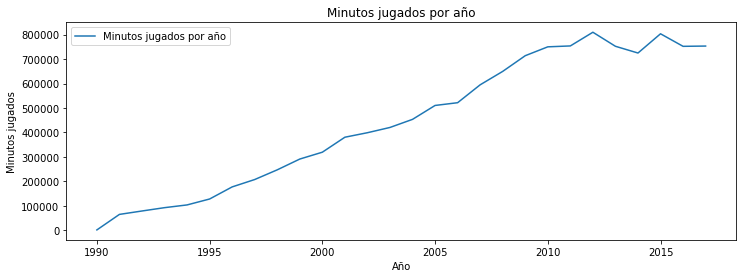

In [28]:
# Grafico de líneas sobre la cantidad de minutos jugados por año

x=pd.unique(result3.index)
y=result3['match_duration'].groupby([result3.index]).sum()
fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(x, y, label='Minutos jugados por año')
ax.set_xlabel('Año')
ax.set_ylabel('Minutos jugados')
ax.set_title('Minutos jugados por año')
ax.legend() 

El gráfico de arriba nos permite observar que ha habido un incremento en la cantidad de minutos jugados por año calendario. Es necesario, para poder realizar un análisis más preciso, tener en cuenta la cantidad de torneos y partidos jugados por año.

Text(0.5, 0, 'Año')

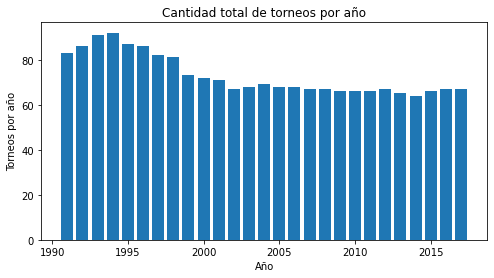

In [29]:
# Grafico de barra de cantidad de torneos por año
fig, ax = plt.subplots(figsize=(8,4))
torneos_x_anio=tournaments['tourney_name'].groupby(tournaments['tourney_year']).count()
ax.bar(pd.unique(tournaments['tourney_year']), torneos_x_anio)
ax.set_title('Cantidad total de torneos por año')
ax.set_ylabel('Torneos por año')
ax.set_xlabel('Año')

En este gráfico lo que estamos haciendo es contabilizar la cantidad de torneos disputados por año para ir dandole un nivel de detalle mayor a la cantidad de minutos jugados por año.

##### Vamos a tratar de ver cuantas dobles faltas por partido cometieron los ganadores vs los perdedoresr de ver cuantas dobles faltas por partido cometieron los ganadores vs los perdedores 

Text(0.5, 0.98, 'Proporción de Dobles Faltas por partido cometidas')

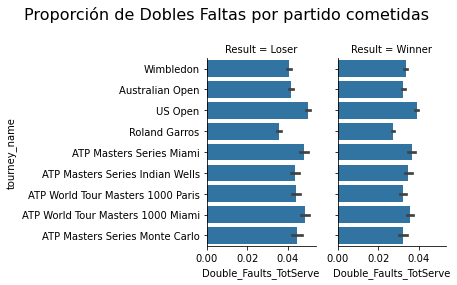

In [30]:
g = sns.FacetGrid(result3, col="Result", height=4, aspect=.8)
g.map(sns.barplot, "Double_Faults_TotServe", "tourney_name",order=['Wimbledon',
                                                        'Australian Open',
                                                        'US Open',
                                                        'Roland Garros',
                                                        'ATP Masters Series Miami',
                                                       'ATP Masters Series Indian Wells',
                                                       'ATP World Tour Masters 1000 Paris',
                                                       'ATP World Tour Masters 1000 Miami',
                                                       'ATP Masters Series Monte Carlo'])
plt.subplots_adjust(top=0.8)
g.fig.suptitle('Proporción de Dobles Faltas por partido cometidas',fontsize=16)

De los gráficos anteriores podemos observar la proporción de Dobles Faltas cometidas tanto por el ganador como el perdedor, en cada torneo respecto al total de saques realizados en el partido.

<AxesSubplot:xlabel='aces', ylabel='tourney_surface'>

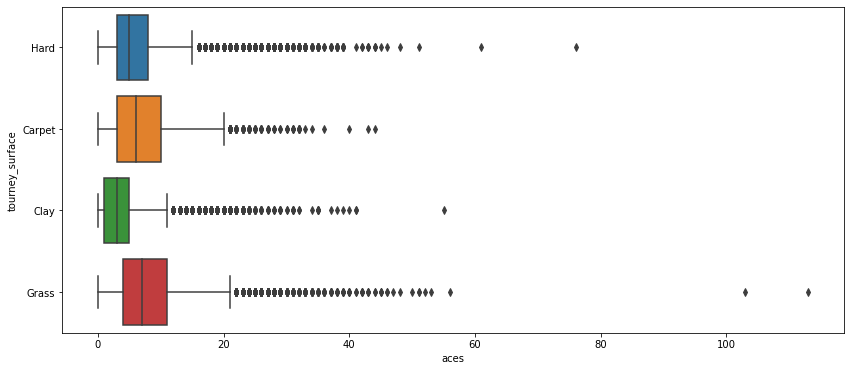

In [31]:
plt.figure(figsize=(14,6))
sns.boxplot(x=result3['aces'], y=result3['tourney_surface'], orient='h')

Aquí podemos observar que el promedio de aces realizados es más alto en los torneos de superficie de polvo de ladrillo, considerando los partidos jugados desde 1991.

<AxesSubplot:xlabel='double_faults', ylabel='match_duration'>

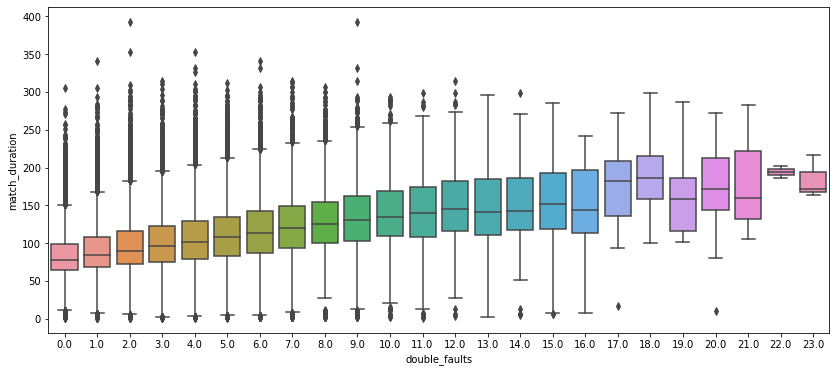

In [32]:
res = result3[result3['match_duration']<=400]
plt.figure(figsize=(14,6))
sns.boxplot(x=res['double_faults'], y=res['match_duration'], orient='v')

De acuerdo a lo observado en este gráfico, podemos concluir que a medida que los partidos duran más, la cantidad de dobles faltas cometidas durante el partido va incrementando.

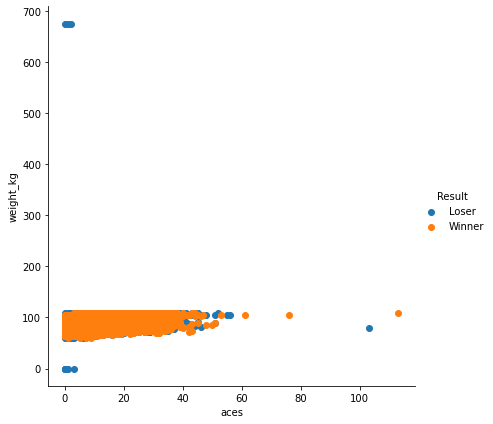

In [33]:
sns.FacetGrid(result3,hue = 'Result', height = 6).map(plt.scatter,'aces','weight_kg').add_legend();
plt.show()

Observamos que en el dataframe hay jugadores que tienen un peso entre 600 y 700kg, y 1 jugador que tienen peso 0. Concluimos que esto es un error ya que es imposible que una persona pese 0kg, asi que lo que haremos a continuación es analizar dichas celdas.

In [34]:
filtro = result3['weight_kg'] == 0
ver1= result3[filtro]
ver1

,match_id,match_time,match_duration,aces,double_faults,player_id,tourney_name,tourney_id,tourney_dates,tourney_surface,Double_Faults_TotServe,Prom_Aces_TotServe,Pointwin_2server,Result,birth_year,weight_kg,height_cm,handedness,backhand
Year,,,,,,,,,,,,,,,,,,,
2007,2008-451-sd23-a653,00:53:00,53.0,0.0,4.0,a653,Doha,451.0,2007-12-31,Hard,0.078431,0.000000,0.444444,Loser,1985.0,0.0,0.0,Right-Handed,Two-Handed Backhand
2009,2009-773-pb12-a703,00:25:00,25.0,0.0,1.0,a703,Bucharest,773.0,2009-09-21,Clay,0.027778,0.000000,0.000000,Loser,1988.0,0.0,0.0,Right-Handed,Two-Handed Backhand
2012,2012-495-j267-a653,00:47:00,47.0,0.0,3.0,a653,Dubai,495.0,2012-02-27,Hard,0.076923,0.000000,0.421053,Loser,1985.0,0.0,0.0,Right-Handed,Two-Handed Backhand
2012,2012-404-r368-a563,01:04:00,64.0,1.0,5.0,a563,ATP World Tour Masters 1000 Indian Wells,404.0,2012-03-08,Hard,0.098039,0.019608,0.250000,Loser,1985.0,0.0,0.0,Left-Handed,Two-Handed Backhand
2013,2013-404-t315-a563,00:56:00,56.0,3.0,3.0,a563,ATP World Tour Masters 1000 Indian Wells,404.0,2013-03-07,Hard,0.063830,0.063830,0.454545,Loser,1985.0,0.0,0.0,Left-Handed,Two-Handed Backhand
2013,2013-337-la50-a703,00:39:00,39.0,0.0,3.0,a703,Vienna,337.0,2013-10-14,Hard,0.068182,0.000000,0.375000,Loser,1988.0,0.0,0.0,Right-Handed,Two-Handed Backhand


In [35]:
filtro = result3['weight_kg'] != 0
result3= result3[filtro]

In [36]:
filtro2 = result3['weight_kg'] > 300
ver2= result3[filtro2]
ver2

,match_id,match_time,match_duration,aces,double_faults,player_id,tourney_name,tourney_id,tourney_dates,tourney_surface,Double_Faults_TotServe,Prom_Aces_TotServe,Pointwin_2server,Result,birth_year,weight_kg,height_cm,handedness,backhand
Year,,,,,,,,,,,,,,,,,,,
2014,2014-6710-e224-pj32,00:59:00,59.0,0.0,1.0,pj32,Dusseldorf,6710.0,2014-05-18,Clay,0.027778,0.000000,0.450000,Loser,1998.0,675.0,180.0,Right-Handed,Two-Handed Backhand
2016,2016-322-d864-pj32,01:32:00,92.0,1.0,2.0,pj32,Geneva,322.0,2016-05-15,Clay,0.035088,0.017544,0.631579,Loser,1998.0,675.0,180.0,Right-Handed,Two-Handed Backhand
2017,2017-506-a887-pj32,01:36:00,96.0,2.0,0.0,pj32,Argentina Open,506.0,2017-02-13,Clay,0.000000,0.032258,0.571429,Loser,1998.0,675.0,180.0,Right-Handed,Two-Handed Backhand


In [37]:
print('Vamos a asumir que el peso correcto del jugador es 67.50 y no 675, en base a busquedas realizadas en internet sobre el peso del jugador Manuel Peña Lopez')
result3['weight_kg']=result3['weight_kg'].replace(675,67.5)

filtro = result3['player_id'] == 'pj32'
ver= result3[filtro]
ver

Vamos a asumir que el peso correcto del jugador es 67.50 y no 675, en base a busquedas realizadas en internet sobre el peso del jugador Manuel Peña Lopez


C:\Users\gmeng\AppData\Local\Temp/ipykernel_3076/2897104172.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result3['weight_kg']=result3['weight_kg'].replace(675,67.5)


,match_id,match_time,match_duration,aces,double_faults,player_id,tourney_name,tourney_id,tourney_dates,tourney_surface,Double_Faults_TotServe,Prom_Aces_TotServe,Pointwin_2server,Result,birth_year,weight_kg,height_cm,handedness,backhand
Year,,,,,,,,,,,,,,,,,,,
2014,2014-6710-e224-pj32,00:59:00,59.0,0.0,1.0,pj32,Dusseldorf,6710.0,2014-05-18,Clay,0.027778,0.000000,0.450000,Loser,1998.0,67.5,180.0,Right-Handed,Two-Handed Backhand
2016,2016-322-d864-pj32,01:32:00,92.0,1.0,2.0,pj32,Geneva,322.0,2016-05-15,Clay,0.035088,0.017544,0.631579,Loser,1998.0,67.5,180.0,Right-Handed,Two-Handed Backhand
2017,2017-506-a887-pj32,01:36:00,96.0,2.0,0.0,pj32,Argentina Open,506.0,2017-02-13,Clay,0.000000,0.032258,0.571429,Loser,1998.0,67.5,180.0,Right-Handed,Two-Handed Backhand


Volvemos a ejecutar el gráfico en donde vamos a relacionar el peso de los jugadores con la cantidad de Aces cometidos.

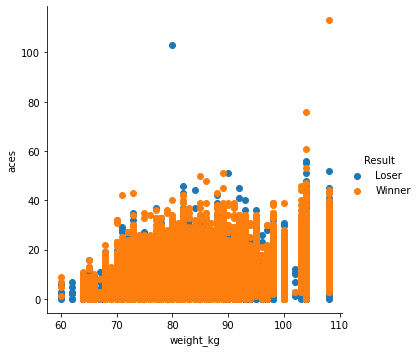

In [38]:
sns.FacetGrid(result3,hue = 'Result', height = 5).map(plt.scatter,'weight_kg','aces').add_legend();
plt.show()

A continuación vamos a relacionar la altura de los jugadores con la cantidad de Aces cometidos.

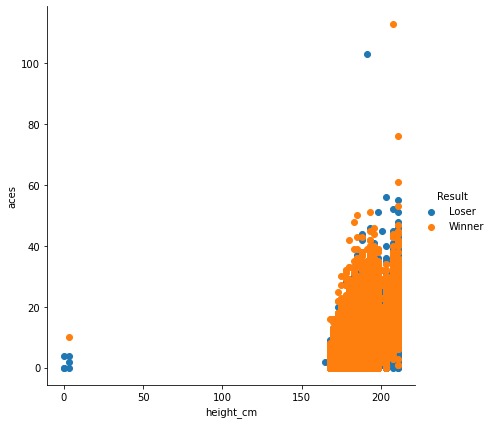

In [39]:
sns.FacetGrid(result3,hue = 'Result', height = 6).map(plt.scatter,'height_cm','aces').add_legend();
plt.show()

Observamos que en el dataframe hay jugadores que tienen una altura igual 0cm. Concluimos que esto es un error ya que es imposible que una persona mida 0cm, asi que lo que haremos a continuación es analizar dichas celdas.

In [40]:
print('Al ser muchas filas las que debemos reemplazar, optamos por la opción más fácil que es obviar dichas filas, total la injerencia de las mismas es mínimas para nuestro análisis deseado')

filtro = result3['height_cm'] > 10
result= result3[filtro]

Al ser muchas filas las que debemos reemplazar, optamos por la opción más fácil que es obviar dichas filas, total la injerencia de las mismas es mínimas para nuestro análisis deseado


### Algoritmos de clasificación

In [41]:
'''Recortamos el dataset para quedarnos solamente con las variables numéricas que nos van a servir
para trabajar sobre el modelo de machine learning'''

df_corr= result3[['aces',
'double_faults',
'Double_Faults_TotServe',
'Prom_Aces_TotServe',
'Pointwin_2server',
'weight_kg',
'height_cm','Result']]
df_corr.head()

,aces,double_faults,Double_Faults_TotServe,Prom_Aces_TotServe,Pointwin_2server,weight_kg,height_cm,Result
Year,,,,,,,,
1990,12.0,5.0,0.060241,0.144578,0.416667,79.0,193.0,Loser
1990,7.0,1.0,0.020408,0.142857,0.705882,79.0,193.0,Winner
1990,6.0,4.0,0.063492,0.095238,0.545455,79.0,193.0,Winner
1990,7.0,4.0,0.050000,0.087500,0.627907,79.0,193.0,Winner
1990,5.0,2.0,0.027027,0.067568,0.620690,79.0,193.0,Winner


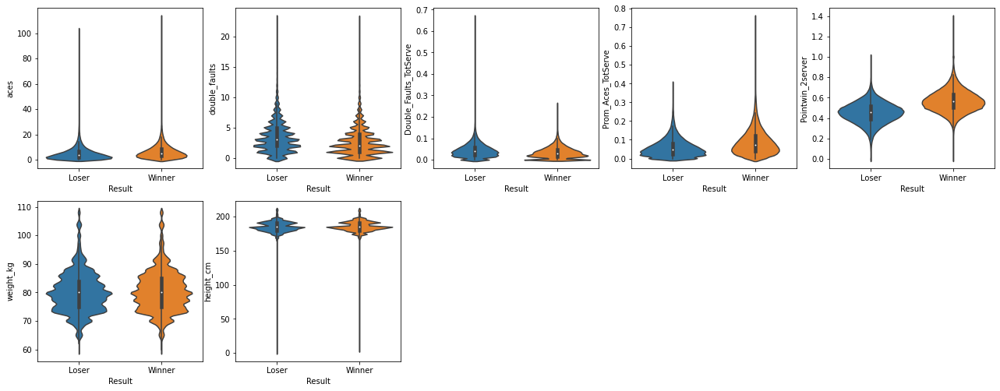

In [42]:
plt.figure(figsize=(22,22))

for column_index, column in enumerate(df_corr.columns):
    if column == 'Result':
        continue
    plt.subplot(5, 5, column_index + 1)
    sns.violinplot(x='Result', y=column, data=df_corr)

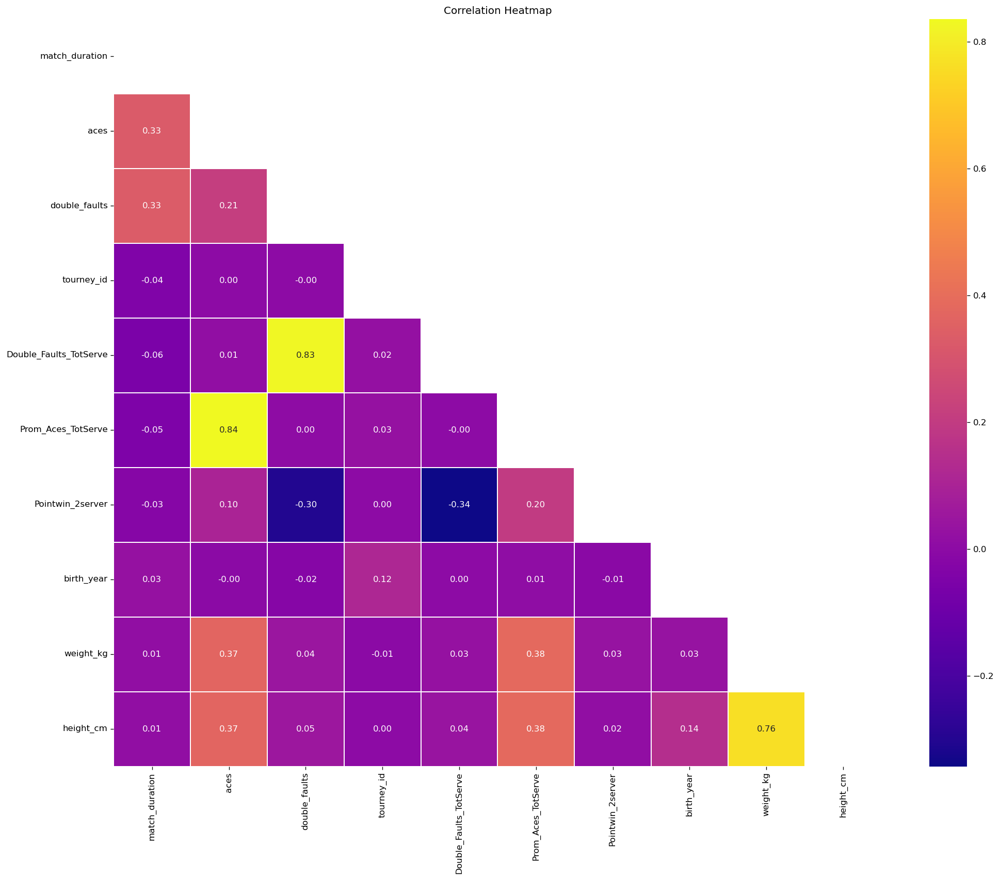

In [43]:
plt.figure(dpi = 120,figsize= (20,16))
mask = np.triu(np.ones_like(result3.corr(),dtype = bool))
sns.heatmap(result3.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

## **Algoritmo de clasificación**

### Random Forest

In [44]:
#Separamos en X e y
X = df_corr.drop(["Result"], axis=1)
y = df_corr["Result"]

In [45]:
#Separamos en train y test!
(X_train, X_test,
y_train, y_test) = train_test_split(X,
                                    y,
                                    stratify=y,
                                    test_size=0.30,
                                    random_state=11)

In [46]:
#Creamos un arbol de decisión sencillo y lo fiteamos
tree = DecisionTreeClassifier(random_state=11)
tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=11)

In [47]:
y_test_pred = tree.predict(X_test) #Prediccion en Test

In [48]:
from sklearn.metrics import accuracy_score

#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)

print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.6365804737897761


In [49]:
#Creamos un random forest!
model = RandomForestClassifier(random_state=11, n_estimators=150,
                               class_weight="balanced", max_features="log2")
model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_features='log2',
                       n_estimators=150, random_state=11)

In [50]:
y_test_pred = model.predict(X_test) #Prediccion en Test

In [51]:
#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)

print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.7077031495636147


##### Matriz de confusión para el algoritmo Random Forest

C:\Users\gmeng\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


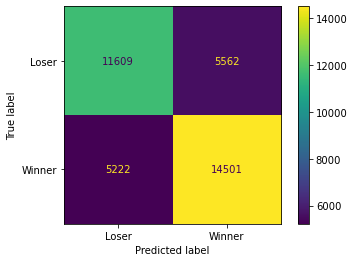

In [52]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(model,X_test, y_test)
plt.show()

### Machine Learning - Modelo de clasificación 

In [53]:
from sklearn.model_selection import train_test_split #Importamos la libreria para separar en train y test

#Me quedo con 30% para test y 70% para train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=150)

In [54]:
from sklearn.tree import DecisionTreeClassifier #Importamos el modelo
arbol_de_decision = DecisionTreeClassifier(max_depth=None, random_state = 150) #Creamos el modelo

In [55]:
arbol_de_decision.fit(X_train,y_train) #Entrenamos el modelo

DecisionTreeClassifier(random_state=150)

In [56]:
y_train_pred = arbol_de_decision.predict(X_train) #Prediccion en Train
y_test_pred = arbol_de_decision.predict(X_test) #Prediccion en Test

In [57]:
from sklearn.metrics import accuracy_score

#Calculo el accuracy en Train
train_accuracy = accuracy_score(y_train, y_train_pred)

#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)

print('% de aciertos sobre el set de entrenamiento:', train_accuracy)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de entrenamiento: 0.9992797899774644
% de aciertos sobre el set de evaluación: 0.6364720550767062


C:\Users\gmeng\miniconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


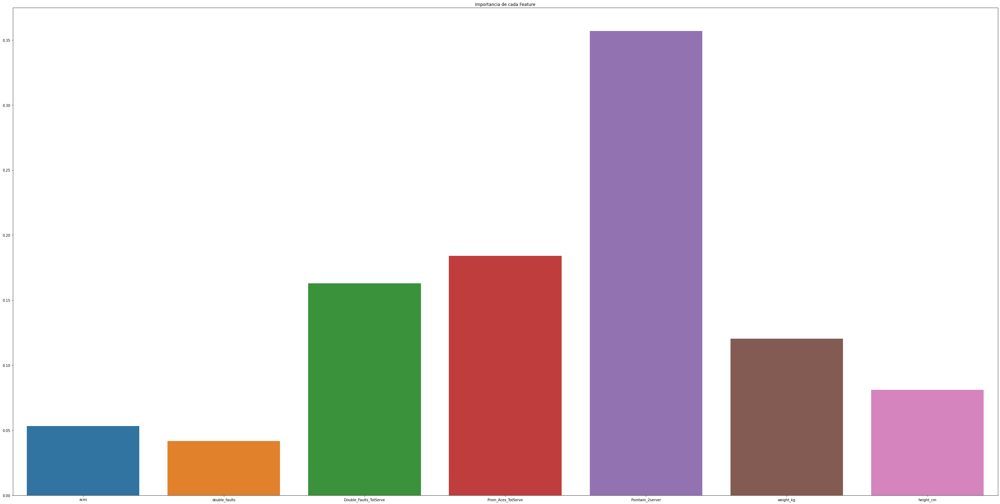

In [58]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(40,20))

importances = arbol_de_decision.feature_importances_
columns = X.columns
sns.barplot(columns, importances)
fig.tight_layout()
plt.title('Importancia de cada Feature')
plt.show()

##### Matriz de confusión para el algoritmo Arbol de Decisión

C:\Users\gmeng\miniconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


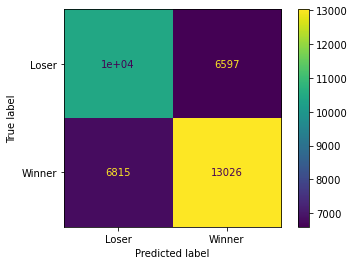

In [59]:
plot_confusion_matrix(arbol_de_decision,X_test, y_test)
plt.show()

## **Algoritmo KNN para predecir la variable  "resultado"**
Este algoritmo nos va a permitir precedir la variable, a partir de supuesto desarollo de partido.

In [64]:
#Creamos una variable nueva con datos random

vn = {'aces' : [6],
'double_faults': [11],
'Double_Faults_TotServe' : [0.06],
'Prom_Aces_TotServe': [0.14],
'Pointwin_2server' : [0.41],
'weight_kg' : [74],
'height_cm': [193.0]}


In [65]:
#Lo convertimos a Df
dfknn = pd.DataFrame(df_corr)
vn = pd.DataFrame(vn)

In [66]:
# Entrenamos al algoritmo 
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=3)
x = df_corr[['aces', 'double_faults', 'Double_Faults_TotServe', 'Prom_Aces_TotServe', 'Pointwin_2server', 'weight_kg','height_cm']]
y = df_corr[['Result']]

knn.fit(x, y)


C:\Users\gmeng\miniconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier(n_neighbors=3)

In [67]:
#Hacemos la predicción
prediction = knn.predict(vn)
print(prediction)

['Loser']


#**Conclusiones**




A partir del análisis hecho logramos entender las características más importantes para alcanzar un resultado positivo.

 Estas variables, cómo el promedio entre cantidad de aces, breakpoints y tiebreaks o la extensión del tiempo jugado se encuentran estrechamente ligadas a la victoria de los torneos. Sumado a eso, logramos analizar la relación entre las contexturas físicas de cada jugador, cómo afecta el tipo de suelo a su rendimiento  y el desarollo de un ganador dentro de cada set, logrando como resultado una predicción del final del partido.

 Estos resultados nos permiten comenzar a perfilar las características de un jugador ideal, lo cual resulta beneficioso para la preparación física de cada tenista.

